In [2]:
%pip install tensorflow tqdm pillow matplotlib ipykernel
# tensorrt multiprocess dill

Note: you may need to restart the kernel to use updated packages.


# Set up the model

In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import PIL
from typing import List, Dict, Union, Tuple, Optional
import PIL.Image
# from multiprocess import Pool
from functools import partial
import os

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

def is_colab():
    try:
        import google.colab
        return True
    except ModuleNotFoundError:
        return False



2023-05-28 15:53:16.088343: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-05-28 15:53:16.133008: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-28 15:53:17.013072: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/anthony/workspace/yt-data/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as not

ModuleNotFoundError: No module named 'multiprocess'

In [ ]:

# Define the generator network
def build_generator(latent_dim):
    model = keras.Sequential([
        layers.Dense(256, input_dim=latent_dim, activation='relu'),
        layers.Dense(512, activation='relu'),
        layers.Dense(1024, activation='relu'),
        layers.Dense(3*64*64, activation='tanh'),
        layers.Reshape((64, 64, 3))
    ])
    return model

# Define the discriminator network
def build_discriminator():
    model = keras.Sequential([
        layers.Flatten(input_shape=(64, 64, 3)),
        layers.Dense(512, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

# Combine the generator and discriminator into a GAN
def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = keras.Sequential([
        generator,
        discriminator
    ])
    return model


def visualize_thumbnails(image_list):
    num_images = image_list.shape[0]

    # Create a grid of subplots to display the images
    fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(12, 10))

    # Iterate over the subplots and plot the generated images
    for i, ax in enumerate(axs.flat):
        # Rescale the pixel values from -1 to 1 to the range 0 to 255
        image = ((image_list[i] + 1) * 127.5).astype(int)
        ax.imshow(image)
        ax.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    # Show the plot
    plt.show()


: 

In [ ]:

# Define the loss functions
def discriminator_loss(real_output, fake_output):
    # Adversarial loss or binary cross-entropy loss
    real_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_output), real_output))
    fake_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_output), fake_output))
    disc_loss = real_loss + fake_loss
    return disc_loss

def generator_loss(fake_output):
    # Adversarial loss or binary cross-entropy loss
    gen_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(fake_output), fake_output))
    return gen_loss


: 

In [ ]:

# Define the optimizer
generator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

if is_colab():
    weight_path = "/content/drive/MyDrive/thumbnail-project/weights"
else:
    weight_path = "./model/weights"
    # Make sure model dir exists
    if not os.path.exists("./model"):
        os.mkdir("./model")

# Training loop
@tf.function
def train_step(images,  gan, generator, discriminator):
    noise = tf.random.normal([BATCH_SIZE, latent_dim]) # Defined globally before training

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


    
    return disc_loss  # Return the discriminator loss as batch_loss

def load_weights(gan):
    try:
        gan.load_weights(weight_path)
        print("Loaded previous weights")
    except Exception as e:
        print(e)


def train(dataset, epochs, gan, generator, discriminator):
    # progress_bar_epochs = tqdm(range(epochs), desc='Epochs', position=0)
    
    for epoch in range(epochs):
        # progress_bar_epochs.update(1)
        
        progress_bar_batches = tqdm(dataset, position=0, leave=True)
        
        for image_batch in progress_bar_batches:
            loss = train_step(image_batch, gan, generator, discriminator)
            
            # progress_bar_batches.update(1)
            progress_bar_batches.set_postfix({'Epoch': epoch, 'Loss': loss})
        
        # progress_bar_batches.close()

        # Update the gan model weights by setting the generator and discriminator weights
        gan.set_weights(generator.get_weights() + discriminator.get_weights())
        gan.save_weights(weight_path)


    




: 

# Download the dataset

In [ ]:
import os
import tarfile


if is_colab():
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # Specify the path to the directory containing the TGZ file
    directory_path = "/content/drive/MyDrive/thumbnail-project"

    # List the contents of the directory
    os.listdir(directory_path)



: 

In [ ]:
# This might already be done from before


if is_colab():
    # # # Specify the path to the TGZ file
    tgz_file_path = f"{directory_path}/thumbnails.tgz"
    extract_path = '/tmp/thumbnails' # Extract to local dir because I/O is horrible on google drive

    # # # Open the TGZ file
    with tarfile.open(tgz_file_path, 'r:gz') as tar:
        # Extract all files in the TGZ archive
        tar.extractall(path=extract_path)

    extract_data_dir = f'{extract_path}/data'
else:
    extract_data_dir = '/home/anthony/workspace/yt-data/data/'

print(f'Thumbnails in {extract_data_dir}')


: 

In [ ]:
# List the files in the extracted directory
# extract_path = f'{directory_path}/thumbnails'
file_list = os.listdir(extract_data_dir)
print(file_list[:10])
print(f'Found {len(file_list)} total files')
jpg_file_list = [file for file in file_list if file.endswith(".jpg")]
print(f'Found {len(jpg_file_list)} jpgs')

: 

In [ ]:

thumbnail_data: List[Tuple[str, str]] = [] # tuples of (path, id)

# Process or use the extracted files
for file_name in jpg_file_list:
    file_path = os.path.join(extract_data_dir, file_name)
    thumbnail_data.append((file_path, file_name.replace('.jpg', '')))

print(thumbnail_data[:10])
print(f'Found {len(thumbnail_data)} thumbnails')

: 

In [ ]:
PIL.Image.open(thumbnail_data[0][0])

: 

In [ ]:
def load_and_preprocess_image(file_path):
    try:
        image = tf.io.read_file(file_path)
        image = tf.image.decode_jpeg(image, channels=3)  # Decode JPEG image
        image = tf.image.resize(image, [64, 64])
        image = tf.cast(image, tf.float32)
        image = (image / 255.0)  # Normalize to [0, 1]
        image = (image - 0.5) * 2  # Scale to [-1, 1]
        return image
    except Exception as e:
        print(e)

# Something doesn't work with this
def preprocess_images_parallel(image_paths, num_processes=2):
    progress = tqdm(total=len(image_paths))
    with Pool(4) as pool:
        # results = pool.map(load_and_preprocess_image, image_paths)
        print(f'preprocessing {len(image_paths)} images.')
    # preprocessed_images = list(tqdm(pool.imap(load_and_preprocess_image, image_paths), total=len(image_paths)))
        results = pool.map(load_and_preprocess_image, image_paths)
        print("results")
        print(results)
        progress.close()

    return results



# dataset = preprocess_images_parallel([path for path, id in thumbnail_data[0:10]])
dataset = [load_and_preprocess_image(t[0]) for t in tqdm(thumbnail_data)] 
dataset

[<tf.Tensor: shape=(240, 180, 3), dtype=float32, numpy=
 array([[[-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         ...,
         [-0.84183013, -0.833987  , -0.8810458 ],
         [-0.89411765, -0.8862745 , -0.93333334],
         [-0.9464054 , -0.9385623 , -0.9856211 ]],
 
        [[-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         ...,
         [-0.8477125 , -0.8398694 , -0.8869282 ],
         [-0.9       , -0.89215684, -0.93921566],
         [-0.95228773, -0.9444446 , -0.9915034 ]],
 
        [[-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         [-0.52156866, -0.54509807, -0.6156863 ],
         ...,
         [-0.8565361 , -0.84869295, -0.8957518 ],
         [-0.9098039 , -0.9019608 , -0.9490196 ],
         [-0.9624185 , -0.95457536, -1.       

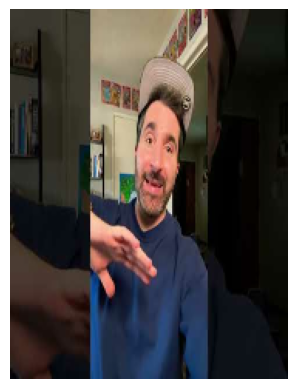

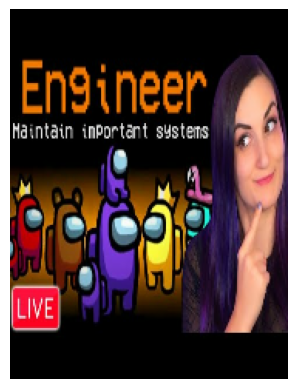

In [ ]:
# Make sure the preprocessing worked

def visualize_preprocessed_image(image):
    # Scale the image from [-1, 1] to [0, 1]
    image = (image + 1) / 2

    # Clip values to [0, 1] in case of any numerical instability
    image = tf.clip_by_value(image, 0, 1)

    # Convert the image tensor to a NumPy array
    image = image.numpy()

    # Display the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

for image in dataset[:2]:
    visualize_preprocessed_image(image)


# Train the model

In [28]:

# Example usage
BATCH_SIZE = 64

latent_dim = 100
generator = build_generator(latent_dim)
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
load_weights(gan)


Unsuccessful TensorSliceReader constructor: Failed to find any matching files for ./model/weights


In [29]:
EPOCHS = 100

# Batch the dataset
batched_dataset = tf.data.Dataset.from_tensor_slices(dataset).batch(BATCH_SIZE)

# Train the GAN
train(batched_dataset, EPOCHS, gan=gan, discriminator=discriminator, generator=generator)


: 

: 

# Make some stuff


In [ ]:

# Generate new thumbnails using the trained generator
noise = tf.random.normal([30, latent_dim])
generated_thumbnails = generator.predict(noise)


1/1 [==============================] - 0s 245ms/step


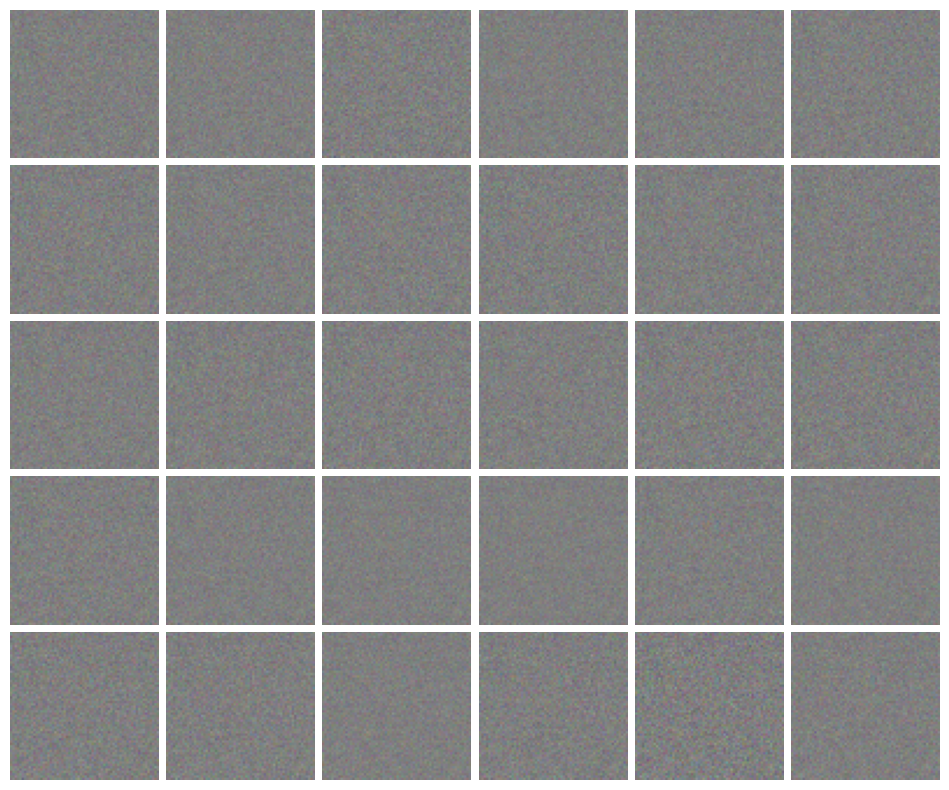

In [ ]:
visualize_thumbnails(generated_thumbnails)
# import matplotlib.pyplot as plt

# num_images = generated_thumbnails.shape[0]

# # Create a grid of subplots to display the images
# fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(12, 10))

# # Iterate over the subplots and plot the generated images
# for i, ax in enumerate(axs.flat):
#     # Rescale the pixel values from -1 to 1 to the range 0 to 255
#     image = ((generated_thumbnails[i] + 1) * 127.5).astype(int)
#     ax.imshow(image)
#     ax.axis('off')

# # Adjust the spacing between subplots
# plt.subplots_adjust(wspace=0.05, hspace=0.05)

# # Show the plot
# plt.show()